## Installs

In [ ]:
%%writefile downloads.sh
pip uninstall kaggle -y
pip install kaggle -q
pip install -U albumentations -q
pip install -U git+https://github.com/lessw2020/Ranger-Deep-Learning-Optimizer -q
pip install -U git+https://github.com/rwightman/efficientdet-pytorch -q
pip install -U git+https://github.com/rwightman/pytorch-image-models -q
pip install --upgrade omegaconf -q
pip install neptune-client -q
mkdir ~/.kaggle/
cp ./kaggle.json ~/.kaggle/kaggle.json
chmod 600 ~/.kaggle/kaggle.json
kaggle competitions download global-wheat-detection
mkdir ./data/
mv global-wheat-detection.zip ./data/global-wheat-detection.zip
unzip ./data/global-wheat-detection.zip -d ./data/
rm ./data/global-wheat-detection.zip

Overwriting downloads.sh


In [ ]:
#!sh downloads.sh

## Setup


In [ ]:
import os
import time
import datetime
import gc
import random
import numpy as np
import pandas as pd
import numba
from numba import jit
from typing import List, Union, Tuple

import cv2
import re
from tqdm.notebook import tqdm
from matplotlib import pyplot as plt
from PIL import Image

import torch
import torchvision
from torch.optim import lr_scheduler
from torch.utils.data import DataLoader, Dataset, WeightedRandomSampler
from torch.cuda.amp import GradScaler
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

from effdet import get_efficientdet_config, EfficientDet, create_model, create_model_from_config, DetBenchTrain, DetBenchPredict
from effdet.efficientdet import HeadNet
from ranger import Ranger
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

import neptune

def seed_everything(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(43)

DIR_INPUT = './data'
DIR_TRAIN = f'{DIR_INPUT}/train'
DIR_TEST = f'{DIR_INPUT}/test'

!nvidia-smi

Thu Jun 18 19:08:13 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.36.06    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from getpass import getpass
from google.colab import auth
from google.cloud import storage


NEPTUNE_API_TOKEN = getpass(prompt='Enter neptune api token: ')
project_id = getpass(prompt='enter gcs project id: ')
bucket_name = getpass(prompt='enter gcs bucketname: ')

if NEPTUNE_API_TOKEN != '':
    os.environ['NEPTUNE_API_TOKEN'] = NEPTUNE_API_TOKEN
    log = True
else:
    log = False

auth.authenticate_user()


def upload_blob(source_file_name, destination_blob_name, bucket_name=bucket_name, PROJECT_ID=project_id):
    """Uploads a file to the bucket."""
    storage_client = storage.Client(project=PROJECT_ID)
    bucket = storage_client.bucket(bucket_name)
    dt_now = datetime.datetime.now().strftime("%d_%B")
    destination_blob_name = 'global-wheat-detection/'+dt_now+'/'+destination_blob_name
    blob = bucket.blob(destination_blob_name)
    blob.upload_from_filename(source_file_name)
    print("File {} uploaded to {}.".format(source_file_name, destination_blob_name))
    print('uploaded blob name: ', destination_blob_name)
    

In [ ]:
!gcloud config set project {project_id}

Updated property [core/project].


In [ ]:
train_df = pd.read_csv(f'{DIR_INPUT}/train.csv')

train_df['x'] = -1
train_df['y'] = -1
train_df['w'] = -1
train_df['h'] = -1

def expand_bbox(x):
    r = np.array(re.findall("([0-9]+[.]?[0-9]*)", x))
    if len(r) == 0:
        r = [-1, -1, -1, -1]
    return r

train_df[['x', 'y', 'w', 'h']] = np.stack(train_df['bbox'].apply(lambda x: expand_bbox(x)))
train_df.drop(columns=['bbox'], inplace=True)
train_df['x'] = train_df['x'].astype(np.float)
train_df['y'] = train_df['y'].astype(np.float)
train_df['w'] = train_df['w'].astype(np.float)
train_df['h'] = train_df['h'].astype(np.float)
train_df['area'] = (train_df['w'] * train_df['h'])/(1024*1024)

mapping = {'arvalis_1': 0, 'arvalis_2': 1, 'arvalis_3': 2, 'ethz_1': 3, 'inrae_1': 4, 'rres_1': 5, 'usask_1': 6}

def unique_count(df):
    for k in mapping:
        if len(df[df['source'] == k]['image_id'].unique()) > 0:
            print('unique images from '+k+' fold '+ str(mapping[k]) + ' ' + str(len(df[df['source'] == k]['image_id'].unique())))

print('combined:')
unique_count(train_df)
print()
train_df['folds'] = train_df.replace({'source': mapping}).source.values
df_train = train_df.copy() # copy
valid_df = train_df[train_df['folds'].isin([1, 2, 4, 6])]   
train_df = train_df[train_df['folds'].isin([0, 3, 5])]      
# Next valid: 1, 2, 5    (leaky) | 4, 5, 6   | 0, 4          (leaky) |  
# Next train: 0, 3, 4, 6 (leaky) | 0, 1, 2, 3| 1, 2, 3, 5, 6 (leaky) |
print('train: ')
unique_count(train_df)
print('valid: ')
unique_count(valid_df)
print()
print('No. of train images', len(train_df['image_id'].unique()))
print('No. of test images', len(valid_df['image_id'].unique()))
print('split percent: ', len(valid_df['image_id'].unique())/(len(train_df['image_id'].unique())+len(valid_df['image_id'].unique())))


combined:
unique images from arvalis_1 fold 0 1055
unique images from arvalis_2 fold 1 204
unique images from arvalis_3 fold 2 559
unique images from ethz_1 fold 3 747
unique images from inrae_1 fold 4 176
unique images from rres_1 fold 5 432
unique images from usask_1 fold 6 200

train: 
unique images from arvalis_1 fold 0 1055
unique images from ethz_1 fold 3 747
unique images from rres_1 fold 5 432
valid: 
unique images from arvalis_2 fold 1 204
unique images from arvalis_3 fold 2 559
unique images from inrae_1 fold 4 176
unique images from usask_1 fold 6 200

No. of train images 2234
No. of test images 1139
split percent:  0.33768158908983104


## Dataset

In [ ]:
class WheatDataset(Dataset):

    def __init__(self, dataframe, image_dir, isValid=True, transforms=None):
        super().__init__()

        self.image_ids = dataframe['image_id'].unique()
        self.df = dataframe
        self.image_dir = image_dir
        self.transforms = transforms
        self.isValid = isValid

    def __len__(self) -> int:
        return self.image_ids.shape[0]
    
    def __getitem__(self, index: int):
        image, boxes = self.load_image(index)

        if not self.isValid:
            if np.random.random()<0.8:
                image, boxes = self.cutmix(image, boxes)

        target = {}
        target['bbox'] = boxes
        target['img_id'] = torch.tensor([index])
        target['cls'] = torch.ones((boxes.shape[0],), dtype=torch.int64)
        if self.transforms:
            for i in range(10):
                sample = self.transforms(**{
                    'image': image,
                    'bboxes': target['bbox'],
                    'labels': target['cls']
                })
                if len(sample['bboxes']) > 0:
                    image = sample['image']
                    #target['bbox'] = torch.as_tensor(sample['bboxes'])
                    target['bbox'] = torch.stack(tuple(map(torch.tensor, zip(*sample['bboxes'])))).permute(1, 0)
                    target['bbox'][:,[0,1,2,3]] = target['bbox'][:,[1,0,3,2]]  #yxyx
                    target['cls'] = torch.stack(sample['labels'])
                    break

        target['img_size'] = (IMG_SIZE, IMG_SIZE)

        return image, target

    def load_image(self, index):
        image_id = self.image_ids[index]
        records = self.df[self.df['image_id'] == image_id]
        image = cv2.imread(f'{self.image_dir}/{image_id}.jpg', cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.uint8)
        boxes = records[['x', 'y', 'w', 'h']].values.astype(np.float32)
        boxes[:, 2] = boxes[:, 0] + boxes[:, 2] 
        boxes[:, 3] = boxes[:, 1] + boxes[:, 3]
        return image, boxes
    
    def cutmix(self, image_1, boxes_1):
        rand_index = self.get_rand_index()
        image_2, boxes_2 = self.load_image(rand_index)
        imsize = image_1.shape[0]
        
        #create two random points
        x1, y1 = [int(random.uniform(0, imsize * 0.45)) for _ in range(2)]
        x2, y2 = [int(random.uniform(imsize * 0.55, imsize)) for _ in range(2)]
        
        #clip the random image
        mixup_image = image_1.copy()
        mixup_target = boxes_2
        mixup_target[:, [0, 2]] = mixup_target[:, [0, 2]].clip(min=x1, max=x2)
        mixup_target[:, [1, 3]] = mixup_target[:, [1, 3]].clip(min=y1, max=y2)
        
        #remove cutout bboxes from first image
        boxes_1 = np.delete(boxes_1, np.where(
            ((boxes_1[:,0] > x1) & (boxes_1[:,2] < x2))
            & ((boxes_1[:,1] > y1) & (boxes_1[:,3] < y2))
        ), 0)

        #remove boxes with low visibility
        cutout_ords = np.array([x1, y1, x2, y2])
        boxes_1 = filter_boxes(boxes_1, cutout_ords)
        boxes_1 = boxes_1[np.where(
            (boxes_1[:,2]-boxes_1[:,0])
            * (boxes_1[:,3]-boxes_1[:,1]) > 64
        )]

        #boxes_1 = boxes_1.astype(np.int32)
        #boxes_1 = boxes_1[np.where(
        #    (boxes_1[:,2]-boxes_1[:,0])
        #    * (boxes_1[:,3]-boxes_1[:,1]) > 128
        #)]

        #remove any bbox with area less than 128
        mixup_target = mixup_target.astype(np.int32)
        mixup_target = mixup_target[np.where(
            (mixup_target[:,2]-mixup_target[:,0])
            * (mixup_target[:,3]-mixup_target[:,1]) > 128
        )]
        
        #mixup
        mixup_target = np.concatenate((boxes_1, mixup_target))
        mixup_image[y1:y2, x1:x2] = (image_2[y1:y2, x1:x2])
        
        return mixup_image, mixup_target

    def get_rand_index(self):
        rand_index = np.random.choice([*range(0, self.image_ids.shape[0]-1)])
        return rand_index
    
def collate_fn(batch):
    return tuple(zip(*batch))

def get_training_datasets():
    datasets = {}
    datasets['train'] = WheatDataset(train_df, DIR_TRAIN, False, get_strong_train_transform())
    datasets['valid'] = WheatDataset(valid_df, DIR_TRAIN, True, get_valid_transform())
    return datasets

@jit(nopython=True)
def filter_boxes(boxes_1, cutout_ords) -> numba.float32[:,:]:
    boxes_1_copy = np.zeros(boxes_1.shape)
    for i in range(boxes_1.shape[0]):
        inter = calculate_intersection(boxes_1[i], cutout_ords)
        if inter < 0.3:
            boxes_1_copy[i] = boxes_1[i]
    return boxes_1_copy

@jit(nopython=True)
def calculate_intersection(gt, pr) -> float:
    # Calculate overlap area
    dx = min(gt[2], pr[2]) - max(gt[0], pr[0])# + 1
    if dx < 0:
        return 0.0
    dy = min(gt[3], pr[3]) - max(gt[1], pr[1])# + 1
    if dy < 0:
        return 0.0
    overlap_area = dx * dy
    area_smaller = (gt[3]-gt[1]) * (gt[2]-gt[0])
    vis = (overlap_area / area_smaller)
    return vis



## Augmentations

In [ ]:
#%%writefile aug.txt
# D0 - 512
# Dx - 512 + 128x
IMG_SIZE = 1024

# Albumentations
def get_strong_train_transform():
    return A.Compose(
        [
         #A.Resize(height=IMG_SIZE, width=IMG_SIZE, p=1),
         A.RandomSizedBBoxSafeCrop(IMG_SIZE, IMG_SIZE, interpolation=1, p=0.33),
         A.HorizontalFlip(),
         A.ShiftScaleRotate(
             shift_limit=0.05, scale_limit=0.1, 
             rotate_limit=10, interpolation=1, p=0.5
            ),
         A.OneOf([
            A.Blur(blur_limit=(1,3), p=0.33),
            A.MedianBlur(blur_limit=3, p=0.33),
            A.ImageCompression(quality_lower=50, p=0.33),
            ], p=0.5),
         A.OneOf([
            A.RandomGamma(gamma_limit=(85, 115), p=0.33),
            A.RandomBrightnessContrast(brightness_limit=0.2, p=0.33),
            A.HueSaturationValue(
                hue_shift_limit=25, sat_shift_limit=25, 
                val_shift_limit=30, p=0.5)
            ], p=0.34),
         A.CLAHE(clip_limit=2.5, p=0.5),
         A.Normalize(always_apply=True, p=1.0),
         ToTensorV2(p=1.0)
        ], bbox_params=A.BboxParams(
            format='pascal_voc',
            min_area=5, 
            min_visibility=0.1,
            label_fields=['labels']
        )
    )

def get_weak_train_transforms():
    return A.Compose(
        [
         A.HorizontalFlip(),
         A.Transpose(),
         A.OneOf([
            A.RandomBrightnessContrast(brightness_limit=0.1, p=0.5),
            A.HueSaturationValue(
                hue_shift_limit=20, sat_shift_limit=30, 
                val_shift_limit=20, p=0.5)
            ], p=0.5),
         A.Normalize(always_apply=True, p=1.0),
         ToTensorV2(p=1.0)
        ], bbox_params=A.BboxParams(
            format='pascal_voc',
            min_area=0, 
            min_visibility=0,
            label_fields=['labels']
        )
    )

def get_valid_transform():
    return A.Compose(
        [
         A.Resize(height=IMG_SIZE, width=IMG_SIZE, p=1),
         A.Normalize(always_apply=True, p=1.0),
         ToTensorV2(p=1.0)
        ], bbox_params=A.BboxParams(
            format='pascal_voc',
            min_area=5, 
            min_visibility=0,
            label_fields=['labels']
        )
    )


### display augs and mixup

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

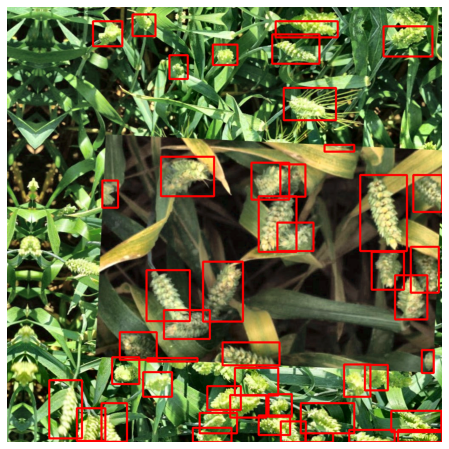

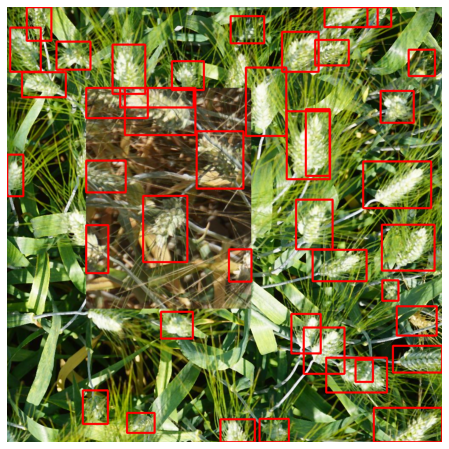

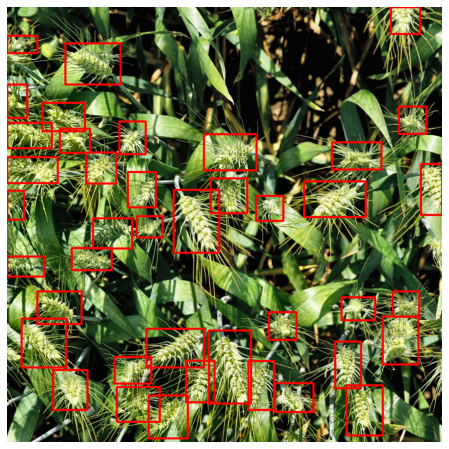

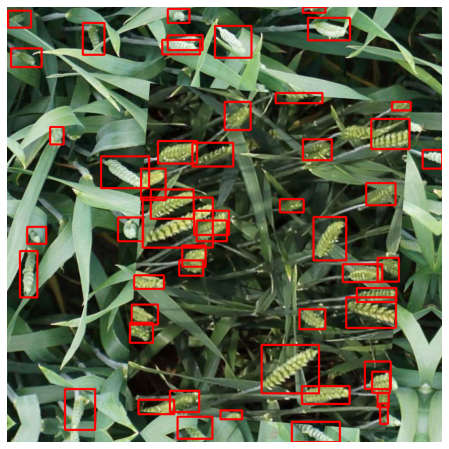

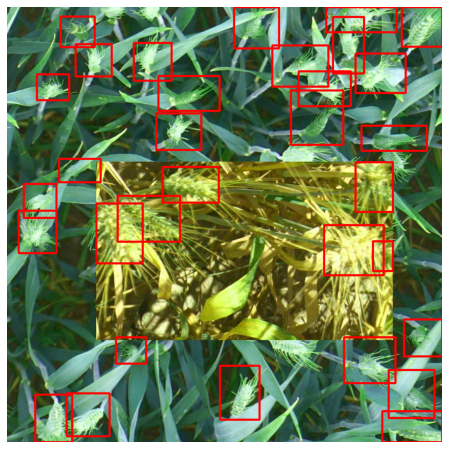

...

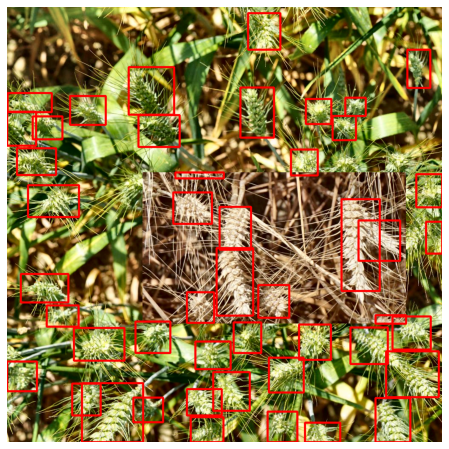

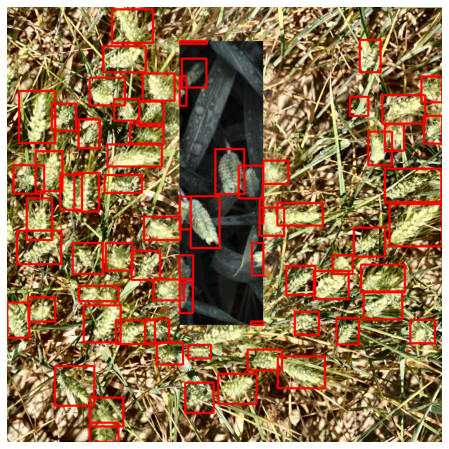

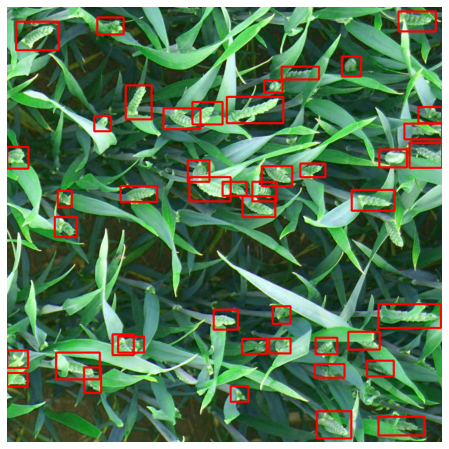

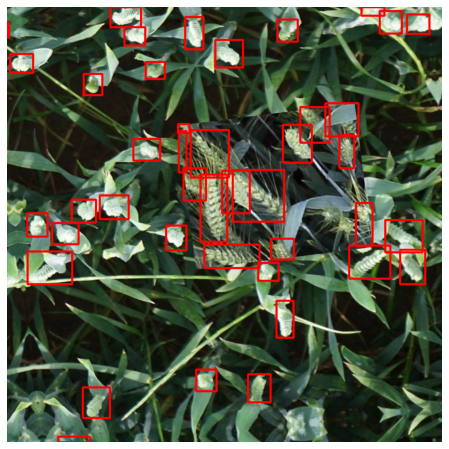

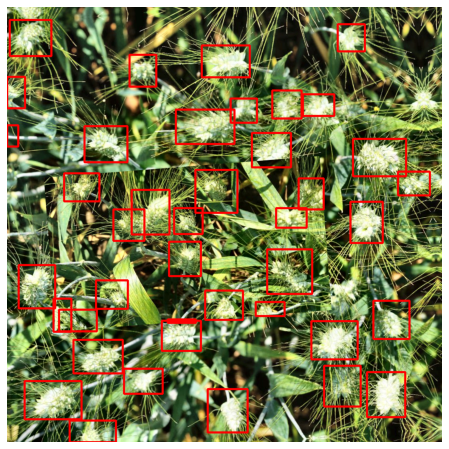

In [ ]:
def mixup(data, targets, alpha=5):
    indices = np.random.permutation(data.size(0))
    temp = list(zip(data, targets['bbox'], targets['cls'], targets['img_scale'], targets['img_size'])) 
    random.shuffle(temp) 
    shuffled_targets = {}
    shuffled_data, shuffled_targets['bbox'], shuffled_targets['cls'], shuffled_targets['img_scale'], shuffled_targets['img_size'] = zip(*temp) 
    lam = np.random.beta(alpha, alpha)
    data = [d * lam for d in data]
    shuffled_data = [d * (1-lam) for d in shuffled_data]
    new_dat = []
    data = [new_dat.append(d + s) for d,s in zip(data, shuffled_data)]
    new_dat = torch.stack(new_dat)
    return new_dat, targets, shuffled_targets, lam

def simple_plot(image, target_boxes):
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    ax.cla()
    thickness = 3 if image.shape[0] > 512 else 2
    image = np.ascontiguousarray(image)
    for box in target_boxes:
        cv2.rectangle(image, (box[0], box[1]), (box[2], box[3]), (255, 0, 0), thickness)
    ax.set_axis_off()
    ax.imshow(image)

def double_plot(image, target_boxes, pred_boxes):
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    ax.cla()
    thickness = 3 if image.shape[0] > 512 else 2
    #image = cv2.UMat(image).get()
    image = np.ascontiguousarray(image)
    for box in target_boxes:
        cv2.rectangle(image, (box[0], box[1]), (box[2], box[3]), (255, 0, 0), thickness)
    for box in pred_boxes:
        cv2.rectangle(image, (box[0], box[1]), (box[2], box[3]), (0, 0, 255), thickness)
    ax.set_axis_off()
    ax.imshow(image)

def display_augs(dataset_name, cutmix=True):
    loader = DataLoader(
        get_training_datasets()[dataset_name], batch_size=16, shuffle=False, 
        num_workers=4, collate_fn=collate_fn
    )
    device = 'cuda'
    with torch.no_grad():
        if dataset_name == 'train':
            for images, targets in loader:
                images = torch.stack(images)
                images = images.to(device).float()
                boxes1 = [b["bbox"].to(device, dtype=torch.float32) for b in targets] 
                labels1 = [l['cls'].to(device, dtype=torch.float32) for l in targets]
                img_size = torch.ones((2,), dtype=torch.float32)
                img_size = img_size.new_full((images.shape[0], 2), float(IMG_SIZE), device=device)
                img_scale = torch.tensor(
                    [IMG_SIZE/896]*images.shape[0], 
                    dtype=torch.float32, device=device
                )
                t = {} 
                t["bbox"] = boxes1 
                t["cls"] = labels1
                t['img_scale'] = img_scale
                t['img_size'] = img_size
                if cutmix:
                    for image, target in zip(images, targets):
                        sample = image.permute(1,2,0).detach().cpu().numpy()
                        sample = (sample  * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
                        boxes1 = target['bbox'].detach().cpu().numpy().astype(np.int32)
                        boxes1 = boxes1[:,[1,0,3,2]]
                        simple_plot(sample, boxes1)
                    break
                else:
                    images, targets1, targets2, lam = mixup(images, t, alpha=5)
                    for image, target1, target2 in zip(images, targets1.get('bbox'), targets2.get('bbox')):
                        sample = image.permute(1,2,0).detach().cpu().numpy()
                        sample = (sample  * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
                        boxes1 = target1.detach().cpu().numpy().astype(np.int32)
                        boxes1 = boxes1[:,[1,0,3,2]]
                        #if 'bbox' in target2:
                        boxes2 = target2.detach().cpu().numpy().astype(np.int32)
                        boxes2 = boxes2[:,[1,0,3,2]]
                        double_plot(sample, boxes1, boxes2)
                        #else:
                        #simple_plot(sample, boxes1)
                    break
        else:
            for images, targets1 in loader:
                images = torch.stack(images)
                images = images.to(device).float()
                for image, target1 in zip(images, targets1, ):
                    sample = image.permute(1,2,0).detach().cpu().numpy()
                    sample = (sample  * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
                    boxes1 = target1['bbox'].detach().cpu().numpy().astype(np.int32)
                    boxes1 = boxes1[:,[1,0,3,2]]
                    simple_plot(sample, boxes1)
                break

display_augs('train')

## Scoring script

In [ ]:
@jit(nopython=True)
def calculate_iou(gt, pr, form='pascal_voc') -> float:
    """Calculates the Intersection over Union.

    Args:
        gt: (np.ndarray[Union[int, float]]) coordinates of the ground-truth box
        pr: (np.ndarray[Union[int, float]]) coordinates of the prdected box
        form: (str) gt/pred coordinates format
            - pascal_voc: [xmin, ymin, xmax, ymax]
            - coco: [xmin, ymin, w, h]
    Returns:
        (float) Intersection over union (0.0 <= iou <= 1.0)
    """
    if form == 'coco':
        gt = gt.copy()
        pr = pr.copy()

        gt[2] = gt[0] + gt[2]
        gt[3] = gt[1] + gt[3]
        pr[2] = pr[0] + pr[2]
        pr[3] = pr[1] + pr[3]

    # Calculate overlap area

    dx = min(gt[2], pr[2]) - max(gt[0], pr[0]) + 1
    
    if dx < 0:
        return 0.0
    
    dy = min(gt[3], pr[3]) - max(gt[1], pr[1]) + 1

    if dy < 0:
        return 0.0

    overlap_area = dx * dy

    # Calculate union area
    union_area = (
            (gt[2] - gt[0] + 1) * (gt[3] - gt[1] + 1) +
            (pr[2] - pr[0] + 1) * (pr[3] - pr[1] + 1) -
            overlap_area
    )

    return overlap_area / union_area

@jit(nopython=True)
def find_best_match(gts, pred, pred_idx, threshold = 0.5, form = 'pascal_voc', ious=None) -> int:
    """Returns the index of the 'best match' between the
    ground-truth boxes and the prediction. The 'best match'
    is the highest IoU. (0.0 IoUs are ignored).

    Args:
        gts: (List[List[Union[int, float]]]) Coordinates of the available ground-truth boxes
        pred: (List[Union[int, float]]) Coordinates of the predicted box
        pred_idx: (int) Index of the current predicted box
        threshold: (float) Threshold
        form: (str) Format of the coordinates
        ious: (np.ndarray) len(gts) x len(preds) matrix for storing calculated ious.

    Return:
        (int) Index of the best match GT box (-1 if no match above threshold)
    """
    best_match_iou = -np.inf
    best_match_idx = -1

    for gt_idx in range(len(gts)):
        #print(gts[gt_idx][0])
        if gts[gt_idx][0] < 0:
            # Already matched GT-box
            continue
        
        iou = -1 if ious is None else ious[gt_idx][pred_idx]

        if iou < 0:
            iou = calculate_iou(gts[gt_idx], pred, form=form)
            
            if ious is not None:
                ious[gt_idx][pred_idx] = iou

        if iou < threshold:
            continue

        if iou > best_match_iou:
            best_match_iou = iou
            best_match_idx = gt_idx

    return best_match_idx

@jit(nopython=True)
def calculate_precision(gts, preds, threshold = 0.5, form = 'coco', ious=None) -> float:
    """Calculates precision for GT - prediction pairs at one threshold.

    Args:
        gts: (List[List[Union[int, float]]]) Coordinates of the available ground-truth boxes
        preds: (List[List[Union[int, float]]]) Coordinates of the predicted boxes,
               sorted by confidence value (descending)
        threshold: (float) Threshold
        form: (str) Format of the coordinates
        ious: (np.ndarray) len(gts) x len(preds) matrix for storing calculated ious.

    Return:
        (float) Precision
    """
    n = len(preds)
    tp = 0
    fp = 0
    
    # for pred_idx, pred in enumerate(preds_sorted):
    for pred_idx in range(n):

        best_match_gt_idx = find_best_match(gts, preds[pred_idx], pred_idx,
                                            threshold=threshold, form=form, ious=ious)

        if best_match_gt_idx >= 0:
            # True positive: The predicted box matches a gt box with an IoU above the threshold.
            tp += 1
            # Remove the matched GT box
            gts[best_match_gt_idx] = -1

        else:
            # No match
            # False positive: indicates a predicted box had no associated gt box.
            fp += 1

    # False negative: indicates a gt box had no associated predicted box.
    fn = (gts.sum(axis=1) > 0).sum()

    return tp / (tp + fp + fn)

@jit(nopython=True)
def calculate_image_precision(gts, preds, thresholds = (0.5, ), form = 'pascal_voc') -> float:
    """Calculates image precision.

    Args:
        gts: (List[List[Union[int, float]]]) Coordinates of the available ground-truth boxes
        preds: (List[List[Union[int, float]]]) Coordinates of the predicted boxes,
               sorted by confidence value (descending)
        thresholds: (float) Different thresholds
        form: (str) Format of the coordinates

    Return:
        (float) Precision
    """
    n_threshold = len(thresholds)
    image_precision = 0.0
    
    ious = np.ones((len(gts), len(preds))) * -1
    # ious = None

    for threshold in thresholds:
        precision_at_threshold = calculate_precision(gts.copy(), preds, threshold=threshold,
                                                     form=form, ious=ious)
        image_precision += precision_at_threshold / n_threshold

    return image_precision

iou_thresholds = numba.typed.List()
for x in [0.5, 0.55, 0.6, 0.65, 0.7, 0.75]:
    iou_thresholds.append(x)


## Model

In [ ]:
def unfreeze_all_layers(model):
    layers_to_train = ['blocks.6','blocks.5', 'blocks.4', 'blocks.3', 'blocks.2', 'blocks.1', 'conv_stem'][:5]
    for name, parameter in model.model.backbone.named_parameters():
        if all([not name.startswith(layer) for layer in layers_to_train]):
            parameter.requires_grad_(True)
            print(f'{name} layer unfrozen')
    return model

def get_train_model(config_name='tf_efficientdet_d0', model_ckpt=None):
    config = get_efficientdet_config(config_name)
    model = EfficientDet(config, pretrained_backbone=True)
    
    #layers_to_train = ['blocks.6','blocks.5', 'blocks.4', 'blocks.3', 'blocks.2', 'blocks.1', 'conv_stem'][:5]
    #for name, parameter in model.backbone.named_parameters():
    #    if all([not name.startswith(layer) for layer in layers_to_train]):
    #        parameter.requires_grad_(False)
    #        print(f'layer {name} frozen')

    config.num_classes = 1
    config.image_size = IMG_SIZE
    model.class_net = HeadNet(config, num_outputs=config.num_classes, norm_kwargs=dict(eps=.001, momentum=.01))
    if model_ckpt is not None:
        model.load_state_dict(torch.load(model_ckpt)['model_state_dict'])
    return DetBenchTrain(model, config)

#model = get_train_model('tf_efficientdet_d3')
#model.train()
#model = unfreeze_all_layers(model)


## Train Scripts

In [ ]:
def train_one_epoch(loader, model, optimizer, device, scaler, scheduler=None, log=False):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    optimizer.zero_grad()
    for i, (images, targets) in tqdm(enumerate(loader), total=len(loader)):  
        images = torch.stack(images)
        images = images.to(device).float()
        boxes = [b["bbox"].to(device, dtype=torch.float32) for b in targets] 
        labels = [l['cls'].to(device, dtype=torch.float32) for l in targets]

        img_size = torch.ones((2,), dtype=torch.float32)
        img_size = img_size.new_full((images.shape[0], 2), float(IMG_SIZE), device=device)
        img_scale = torch.tensor(
            [IMG_SIZE/1024]*images.shape[0], # use 1
            dtype=torch.float32, device=device
        )

        t = {} 
        t["bbox"] = boxes
        t["cls"] = labels
        t['img_scale'] = img_scale
        t['img_size'] = img_size

        #lam = -1
        #if np.random.random() < 0.2:
        #    images, targets1, targets2, lam = mixup(images, t, alpha=5)
        #    loss_dict1 = model(images, targets1)
        #    loss_dict2 = model(images, targets2)
        #    losses1 = loss_dict1['loss'] / FLAGS['accumulation_steps']
        #    losses2 = loss_dict2['loss'] / FLAGS['accumulation_steps']
        #    total_loss = lam * losses1 + (1-lam) * losses2
        #else:
        loss_dict = model(images, t)
        losses = loss_dict['loss'] / FLAGS['accumulation_steps']
        total_loss = losses

        loss_value = total_loss.item()
        running_loss += float(loss_value)
        batch_loss += float(loss_value)
        
        if scaler:
            scaler.scale(total_loss).backward()
        else:
            (total_loss).backward()

        if (i+1) % FLAGS['accumulation_steps'] == 0:
            if scaler:
                scaler.step(optimizer)
                scaler.update()
            else:
                optimizer.step()
            optimizer.zero_grad()

            if scheduler:
                scheduler.step()
            if log:
                neptune.log_metric('batch_loss/train', batch_loss)
            batch_loss = 0.0
                #     neptune.log_metric('class_loss/train', float(lam * loss_dict1.get('class_loss').item() + (1-lam) * loss_dict2.get('loss').item()))
                #     neptune.log_metric('box_loss/train', float(lam * loss_dict1.get('box_loss').item() + (1-lam) * loss_dict2.get('loss').item()))
                # else:
                #     neptune.log_metric('loss/train', float(loss_dict.get('loss').item()))
                #     neptune.log_metric('class_loss/train', float(loss_dict.get('class_loss').item()))
                #     neptune.log_metric('box_loss/train', float(loss_dict.get('box_loss').item()))
                    
    return running_loss/len(loader)

def val_one_epoch(model, loader):
    model.eval()
    running_loss = 0.0
    validation_image_precisions = []
    with torch.no_grad():
        for idx, (images, targets) in tqdm(enumerate(loader), total=len(loader)):
            images = torch.stack(images)
            images = images.to(device).float()
            gt_boxes = np.array(list(target['bbox'].data.cpu().numpy() for target in targets))
            gt_labels = np.array(list(target['cls'].data.cpu().numpy() for target in targets))
            boxes = [b["bbox"].to(device, dtype=torch.float32) for b in targets] 
            labels = [l['cls'].to(device, dtype=torch.float32) for l in targets]
            
            t = {} 
            t["bbox"] = boxes 
            t["cls"] = labels
            
            img_scales = torch.tensor([1]*images.shape[0], dtype=torch.float32, device=device)
            img_size = torch.ones((2,), dtype=torch.float32)
            img_size = img_size.new_full((images.shape[0], 2), float(IMG_SIZE)).to(device)
            t['img_scale'] = img_scales
            t['img_size'] = img_size
            outputs = model(images, t)
            running_loss += float(outputs['loss'])

            #['loss', 'class_loss', 'box_loss', 'detections']
            for i in range(images.shape[0]): 
                pred_boxes = outputs.get('detections')[i].detach().cpu().numpy()[:,:4]    
                scores = outputs.get('detections')[i].detach().cpu().numpy()[:,4]
                indexes = np.where(scores > 0.4)[0]
                pred_boxes = pred_boxes.astype(np.int32)
                #xywh (coco)-> xyxy (pascal_voc)= x,y,x+w,y+h
                pred_boxes[:, 2] = pred_boxes[:, 2] + pred_boxes[:, 0]
                pred_boxes[:, 3] = pred_boxes[:, 3] + pred_boxes[:, 1]
                target_boxes = gt_boxes[i].astype(np.int32)
                target_boxes = target_boxes[:,[1,0,3,2]]
                image_precision = calculate_image_precision(
                    target_boxes, pred_boxes[indexes],
                    thresholds=iou_thresholds,
                    form='pascal_voc'
                )
                validation_image_precisions.append(image_precision)
             
    return np.array(validation_image_precisions).mean(), running_loss/len(loader)

def save_upload(bench, optimizer, epoch, scheduler, val_metric, exp_name, fold=None):
    if fold is not None:
        NAME = exp_name+f'_fold_{fold}_{str(epoch+1)}_map_'+ str(round(val_metric, 4)) +'.ckpt'
    
    NAME = exp_name+f'_{str(epoch+1)}_map_'+ str(round(val_metric, 5)) +'.ckpt'
    MODEL_PATH = NAME
    torch.save({
        'model_state_dict': bench.model.state_dict(),
    }, MODEL_PATH)
    print(f"Saved ckpt for epoch {epoch+1}")
    upload_blob(MODEL_PATH, NAME)
    print(f"Uploaded ckpt for epoch {epoch+1}")


In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

def train_job(model_name, model_ckpt=None, log=True):
    exp_name = FLAGS['exp_name']
    if log:
        neptune.set_project('utsav/wheat-det')
        neptune.init('utsav/wheat-det', api_token=NEPTUNE_API_TOKEN)
        neptune.create_experiment(
            FLAGS['exp_name'], exp_description, params=FLAGS,
            upload_source_files='*.txt'
        )
    best_score = 0.0
    start_epoch = 0

    #sampler
    #fold_value_counts = train_df['folds'].value_counts()
    #fold_sample_counts = [value_counts.astype(np.float32) for value_counts in fold_value_counts]
    #num_samples = sum(fold_sample_counts)
    #class_weights = [num_samples/fold_sample_counts[i] for i in range(len(fold_sample_counts))]
    #weights = [class_weights[train_df['folds'].values[i]] for i in range(int(num_samples))]
    #sampler = WeightedRandomSampler(torch.DoubleTensor(weights), int(num_samples))

    datasets = get_training_datasets()
    train_loader = DataLoader(
        datasets['train'], batch_size=FLAGS['batch_size'],
        num_workers=FLAGS['num_workers'], shuffle=True, #sampler=sampler, #
        collate_fn=collate_fn
    )
    val_loader = DataLoader(
        datasets['valid'], batch_size=FLAGS['batch_size']*2, shuffle=False,
        num_workers=FLAGS['num_workers'], collate_fn=collate_fn
    )

    if model_ckpt is not None:
        model = get_train_model(model_name, model_ckpt)
    else:
        model = get_train_model(model_name)
    model.to(device)

    optimizer = Ranger(
        model.parameters(),
        lr=FLAGS['learning_rate'], 
        alpha=0.5, k=6, N_sma_threshhold=5,
        weight_decay=FLAGS['weight_decay']
    )

    scheduler = lr_scheduler.ReduceLROnPlateau(
        optimizer, 'min', factor=0.75, verbose=True, 
        patience=FLAGS['scheduler_pat'] 
    )

    if model_ckpt is not None:
        checkpoint = torch.load(model_ckpt)

    scaler = GradScaler()
    es = 0
    for epoch in range(start_epoch, FLAGS['num_epochs']):

        print('-'*27 + f'Epoch #{epoch+1} started' + '-'*27)
        
        train_loss = train_one_epoch(
            train_loader, model, optimizer, 
            device, scaler, scheduler=None, log=log
        )
        print(f'Average loss for epoch #{epoch+1} : {train_loss}')
        
        val_metric, val_loss = val_one_epoch(model, val_loader)
        scheduler.step(val_loss)

        print(f'metric/val : {val_metric}')
        print(f'loss/val : {val_loss}')
        
        if log:
            neptune.log_metric('metric/val', val_metric)
            neptune.log_metric('loss/val', val_loss)
        
        #if epoch==FLAGS['unfreeze_epoch']:
        #    model = unfreeze_all_layers(model)

        if (val_metric > best_score) or (best_score-val_metric<0.01):
            es = 0
            if (val_metric > best_score):
                best_score = val_metric
            if epoch>9:
                save_upload(
                    model, optimizer, epoch, 
                    scheduler, val_metric, 
                    exp_name=FLAGS['exp_name']
                )
        #else:
        #    if epoch>24:
        #        es+=1
            #if es > FLAGS['early_stop_count']:
            #    print('Early stopping...')
            #    break

        print('-'*28 + f'Epoch #{epoch+1} ended' + '-'*28)

    neptune.stop()


## Train

In [ ]:
FLAGS = {}
FLAGS['num_workers'] = 4
FLAGS['batch_size'] = 1
FLAGS['accumulation_steps'] = 16
FLAGS['learning_rate'] = 1e-3
FLAGS['num_epochs'] = 60
FLAGS['weight_decay'] = 5e-3
FLAGS['exp_name'] = 'tf_efficientdet_d5'
FLAGS['fold'] = '0, 3, 5'
#FLAGS['unfreeze_epoch'] = 20
#FLAGS['early_stop_count'] = 9
FLAGS['scheduler_pat'] = 7
exp_description = '''
tf_efficientdet_d5,
Ranger, ReduceLROnPlateau
New Aug + Cutmix,
imsize 1024
'''
#try:
train_job('tf_efficientdet_d5', log=False)
#except KeyboardInterrupt:
#    neptune.stop()
#except:
#neptune.stop()

## Predict

In [ ]:
def write_output(sample, target_boxes, boxes=None, filename=None):
    sample = sample * 255.
    for box in boxes:
        cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (0, 0, 255), 3)
    for box in target_boxes:
        cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (0, 255, 0), 3)
    if not os.path.exists('output'):
        os.makedirs('output')
    if filename is not None:
        cv2.imwrite('./output/'+filename+'.jpg', sample) 
        
def format_prediction_string(boxes, scores):
    pred_strings = []
    for s, b in zip(scores, boxes.astype(int)):
        pred_strings.append(f'{s:.4f} {b[0]} {b[1]} {b[2] - b[0]} {b[3] - b[1]}')
    return " ".join(pred_strings)


In [ ]:
def get_predict_model(config_name, model_ckpt):
    config = get_efficientdet_config(config_name)
    model = EfficientDet(config, pretrained_backbone=False)
    config.num_classes = 1
    config.image_size = IMG_SIZE
    model.class_net = HeadNet(config, num_outputs=config.num_classes, norm_kwargs=dict(eps=.001, momentum=.01))
    model.load_state_dict(torch.load(model_ckpt)['model_state_dict'])
    return DetBenchPredict(model, config)

model = get_predict_model('tf_efficientdet_d4', '/content/tf_efficientdet_d4_40_map_0.5966.ckpt')
model.eval().cuda()
print('Model loaded')

Model loaded


In [ ]:
def predict(detection_threshold=0.4, write_output=False):
    datasets = get_training_datasets()
    val_loader = DataLoader(
        datasets['valid'], batch_size=FLAGS['batch_size']*4, shuffle=False, 
        num_workers=FLAGS['num_workers'], collate_fn=collate_fn
    )
    iou_thresholds = numba.typed.List()
    for x in [0.5, 0.55, 0.6, 0.65, 0.7, 0.75]:
        iou_thresholds.append(x)
    validation_image_precisions2 = []
    with torch.no_grad():
        for idx, (images, targets) in tqdm(enumerate(val_loader), total=len(val_loader)):
            images = torch.stack(images)
            images = images.to(device).float()
            gt_boxes = np.array(list(target['bbox'].data.cpu().numpy() for target in targets))
            gt_labels = np.array(list(target['cls'].data.cpu().numpy() for target in targets))
            boxes = [b["bbox"].to(device, dtype=torch.float32) for b in targets] 
            labels = [l['cls'].to(device, dtype=torch.float32) for l in targets]
            t = {} 
            t["bbox"] = boxes 
            t["cls"] = labels
            img_scales = torch.tensor([1]*images.shape[0], dtype=torch.float32, device=device)
            img_size = torch.ones((2,), dtype=torch.float32)
            img_size = img_size.new_full((images.shape[0], 2), float(IMG_SIZE)).to(device)
            t['img_scale'] = img_scales
            t['img_size'] = img_size
            outputs = model(images, img_scales, img_size)
            for i, image in enumerate(images):
                boxes = outputs[i].detach().cpu().numpy()[:,:4]    
                image_scores = outputs[i].detach().cpu().numpy()[:,4]
                indexes = np.where(image_scores > detection_threshold)[0]
                boxes = boxes.astype(np.int32)
                boxes[:, 2] = boxes[:, 2] + boxes[:, 0]
                boxes[:, 3] = boxes[:, 3] + boxes[:, 1]
                target_boxes = gt_boxes[i].astype(np.int32)
                target_boxes = target_boxes[:,[1,0,3,2]]
                image_precision2 = calculate_image_precision(target_boxes,
                                                             boxes[indexes],
                                                             thresholds=iou_thresholds,
                                                             form='pascal_voc')
                validation_image_precisions2.append(image_precision2)
                if write_output == True:
                    image = image * 255
                    image = image.permute(1,2,0).cpu().numpy()
                    image = np.ascontiguousarray(image)
                    image = (image  * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
                    image_id = image_ids[i]
                    write_output(image, target_boxes, boxes=boxes[indexes], filename=image_ids[i])
                #double_plot(image, target_boxes, boxes[indexes])
                #plot(image, target_boxes, boxes)

    print(f"Validation IOU: {np.mean(validation_image_precisions2)}, det threshold: {detection_threshold}")
    return np.mean(validation_image_precisions2)

In [ ]:
best_map_score = 0.0
thresh = 0.0
score_list = []
for i in list(range(38, 61, 1)):
    score = predict(i/100.0)
    score_list.append({'thresh':i/100.0, 'score':score})
    if score > best_map_score:
        best_map_score = score
        thresh = i/100.0
print(f'best score: {best_map_score} at theshold {thresh}')


Validation IOU: 0.5900029977715264, det threshold: 0.38



Validation IOU: 0.5934979752789243, det threshold: 0.39



Validation IOU: 0.5966032840149798, det threshold: 0.4



Validation IOU: 0.5990300075606826, det threshold: 0.41



Validation IOU: 0.6001577287243743, det threshold: 0.42



Validation IOU: 0.6011251463069006, det threshold: 0.43



Validation IOU: 0.6014651716603389, det threshold: 0.44



Validation IOU: 0.6017610285307465, det threshold: 0.45



Validation IOU: 0.6021741649310255, det threshold: 0.46



Validation IOU: 0.6009662344767032, det threshold: 0.47



Validation IOU: 0.599944990539176, det threshold: 0.48


KeyboardInterrupt: ignored

In [ ]:
'''
img_scale: a float tensor representing the scale between original image
and input image for the detector. It is used to rescale detections for
evaluating with the original groundtruth annotations. 
'''